In [1]:
import os 
import cv2
import matplotlib.pyplot as plt
import random 

In [2]:
train_images_dir = "../data/raw/road-damage-1/train/images"
train_labels_dir = "../data/raw/road-damage-1/train/labels"

image_files = os.listdir(train_images_dir)
print(f"NO.images {len(image_files)}")
print(f"First 5 names {image_files[:5]}")

NO.images 2325
First 5 names ['T_5630_jpeg.rf.f017dd9c6285e6f0c032ad1fcade94a0.jpg', 'BL_2670_jpeg.rf.6aaac0fa8729b674b1396ac87be3d232.jpg', 'F_36130_jpeg.rf.766c5d40bb983ab6ef4178c1c80c2126.jpg', 'BF_80_jpeg.rf.388f99d0c060bdc9b550ef12fffb0b1d.jpg', 'K_13430_jpeg.rf.f8a31a79a3dc01c06b4a9633bf3f262a.jpg']


In [3]:
random_image = random.choice(image_files)
image_path = os.path.join(train_images_dir, random_image)

label_filename = os.path.splitext(random_image)[0] + ".txt"
label_path = os.path.join(train_labels_dir, label_filename)

print(f"Image: {random_image}")
print(f"Label file: {label_filename}")

with open(label_path, "r") as f:
    label_content = f.read()
print("Content of label:")
print(label_content)

Image: F_24170_jpeg.rf.d22e48b0d465f56edfb6e1104fdbab28.jpg
Label file: F_24170_jpeg.rf.d22e48b0d465f56edfb6e1104fdbab28.txt
Content of label:
0 0.6229166666666667 0.7708333333333334 0.11979166666666667 0.05092592592592592



We pick a random image, read its matching YOLO-format label file,
and draw the bounding box on it to confirm the labeling is correct
before we start training.


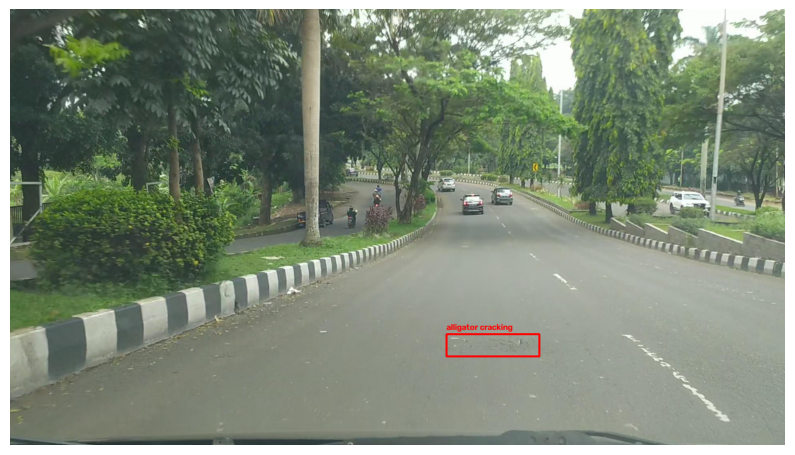

In [ ]:
# Read the image and convert colors from BGR to RGB
# (OpenCV reads colors as BGR by default, but matplotlib expects RGB)
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img_height, img_width = image.shape[:2]

# List of class names in the same order as in data.yaml
# لستة أسماء الفئات بنفس الترتيب الموجود بملف data.yaml
class_names = ["alligator cracking", "lateral cracking", "longitudinal cracking", "pothole"]

# Read all lines (objects) from the label file
# نقرأ كل الأسطر (الأجسام الموسومة) من ملف الـ label
with open(label_path, "r") as f:
    lines = f.readlines()

for line in lines:
    values = line.strip().split()
    class_id = int(values[0])
    x_center, y_center, width, height = map(float, values[1:])

    # Convert normalized coordinates (0-1) to actual pixel coordinates
    # تحويل الإحداثيات النسبية (0-1) لإحداثيات pixels حقيقية
    x_center_px = x_center * img_width
    y_center_px = y_center * img_height
    width_px = width * img_width
    height_px = height * img_height

    # Calculate top-left and bottom-right corners from center point
    # حساب الزاوية العلوية اليسرى والسفلية اليمنى انطلاقاً من نقطة المركز
    x1 = int(x_center_px - width_px / 2)
    y1 = int(y_center_px - height_px / 2)
    x2 = int(x_center_px + width_px / 2)
    y2 = int(y_center_px + height_px / 2)

    # Draw the bounding box and write the class name above it
    # رسم الصندوق وكتابة اسم الفئة فوقه
    cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 3)
    cv2.putText(image, class_names[class_id], (x1, y1 - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)

# Display the image inside the notebook
# عرض الصورة داخل الـ notebook
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
plt.show()

In [5]:
# Wrap the visualization logic in a reusable function so we can check
# multiple images easily, instead of repeating the same code each time
# نلف منطق العرض بدالة قابلة لإعادة الاستخدام عشان نفحص عدة صور بسهولة،
# بدل ما نعيد نفس الكود كل مرة
def show_labeled_image(image_filename, images_dir, labels_dir, class_names):
    image_path = os.path.join(images_dir, image_filename)
    label_filename = os.path.splitext(image_filename)[0] + ".txt"
    label_path = os.path.join(labels_dir, label_filename)

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_height, img_width = image.shape[:2]

    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        values = line.strip().split()
        class_id = int(values[0])
        x_center, y_center, width, height = map(float, values[1:])

        x_center_px = x_center * img_width
        y_center_px = y_center * img_height
        width_px = width * img_width
        height_px = height * img_height

        x1 = int(x_center_px - width_px / 2)
        y1 = int(y_center_px - height_px / 2)
        x2 = int(x_center_px + width_px / 2)
        y2 = int(y_center_px + height_px / 2)

        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 3)
        cv2.putText(image, class_names[class_id], (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)

    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.title(f"{image_filename} | {len(lines)} object(s)")
    plt.axis("off")
    plt.show()


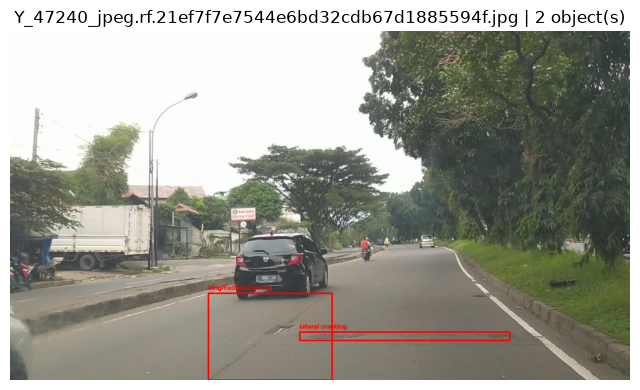

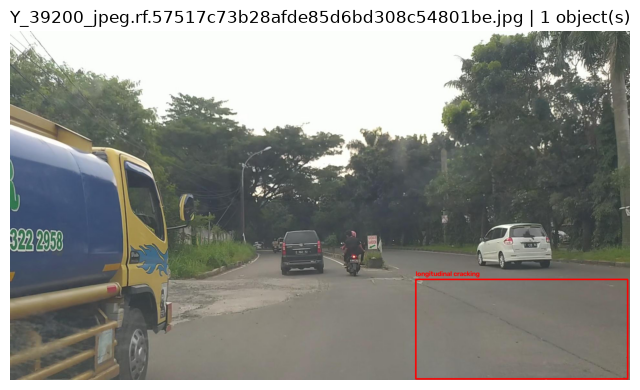

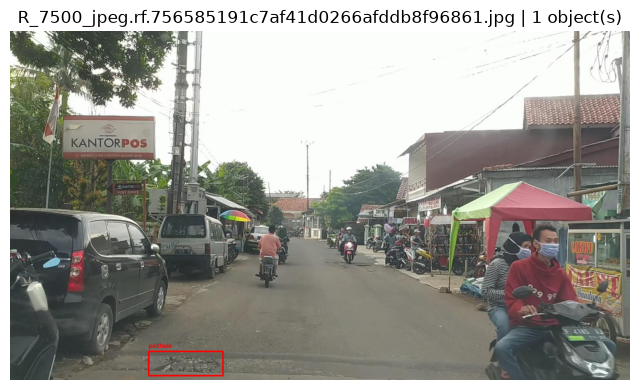

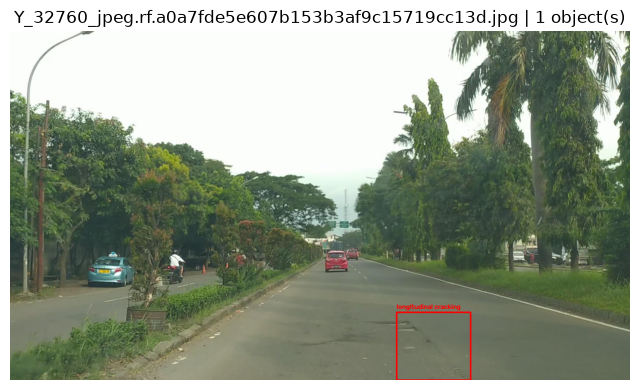

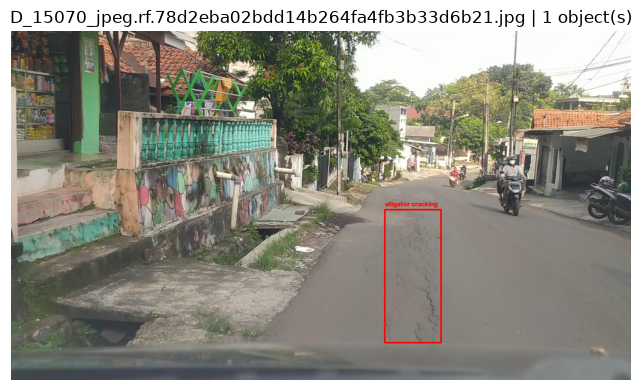

In [6]:
# Try the function on 5 random images to visually verify multiple labels
# نجرب الدالة على 5 صور عشوائية للتأكد بصرياً من عدة توسيمات
sample_images = random.sample(image_files, 5)

for img_name in sample_images:
    show_labeled_image(img_name, train_images_dir, train_labels_dir, class_names)


image 1/1 /workspaces/road-damage-detection/notebooks/../data/raw/road-damage-1/test/images/Y_31600_jpeg.rf.6382603647093e48a73ac9423bf1dacc.jpg: 384x640 1 pothole, 1887.3ms
Speed: 72.5ms preprocess, 1887.3ms inference, 280.1ms postprocess per image at shape (1, 3, 384, 640)


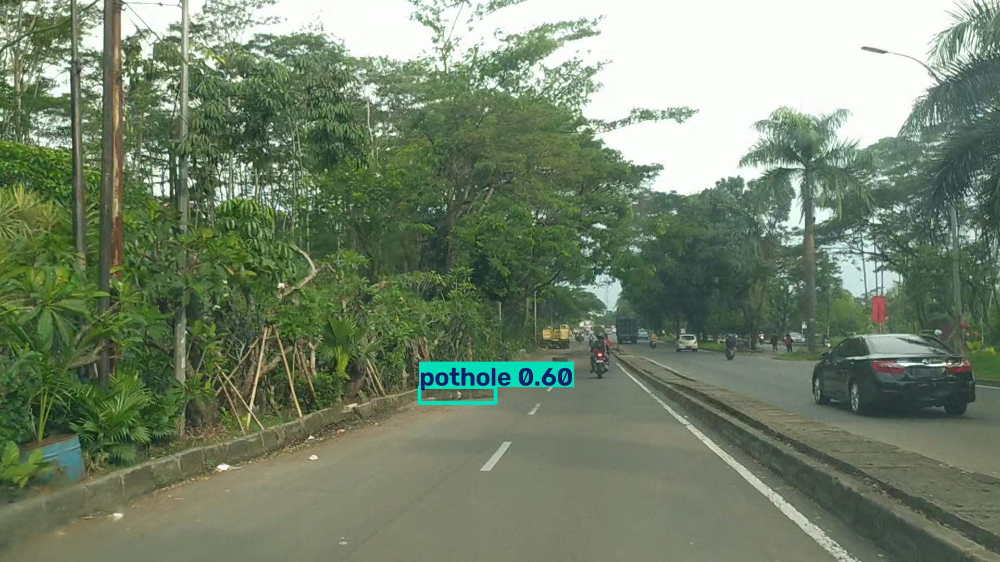


image 1/1 /workspaces/road-damage-detection/notebooks/../data/raw/road-damage-1/test/images/P_32070_jpeg.rf.ab2ca80251d3792fd81486d027395f19.jpg: 384x640 1 pothole, 73.2ms
Speed: 4.3ms preprocess, 73.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


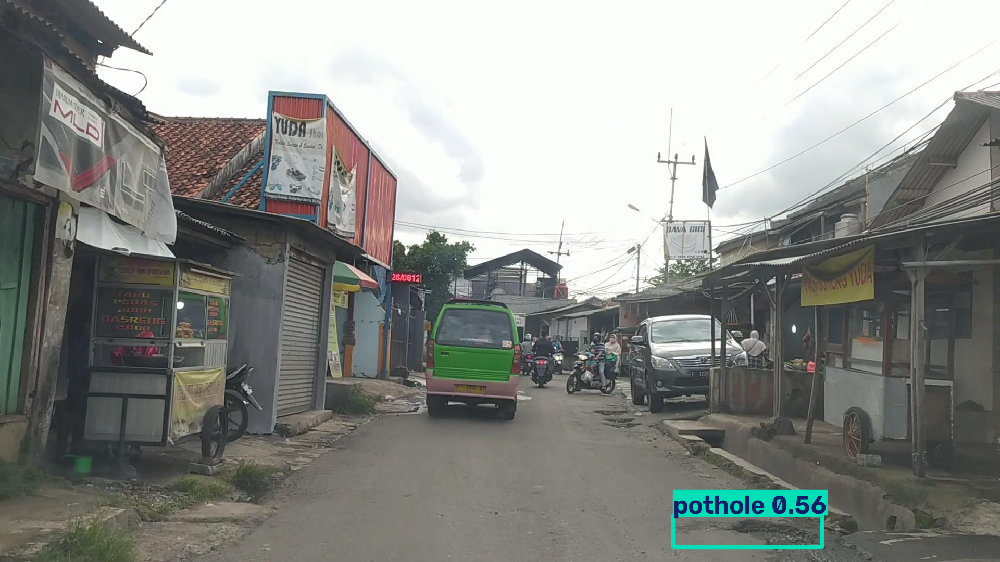


image 1/1 /workspaces/road-damage-detection/notebooks/../data/raw/road-damage-1/test/images/BM_2790_jpeg.rf.bafa01a02cdda1830e2318c5b4b15d61.jpg: 384x640 1 lateral cracking, 1 longitudinal cracking, 199.3ms
Speed: 11.5ms preprocess, 199.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


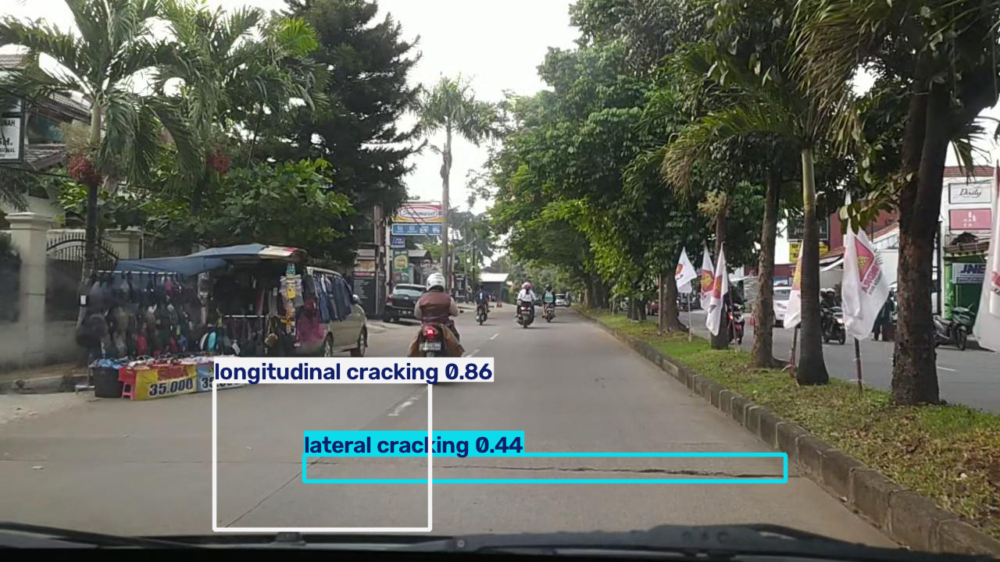


image 1/1 /workspaces/road-damage-detection/notebooks/../data/raw/road-damage-1/test/images/BL_2680_jpeg.rf.4d0db8803dfd2428865256544da104e3.jpg: 384x640 1 alligator cracking, 1 pothole, 51.2ms
Speed: 2.5ms preprocess, 51.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


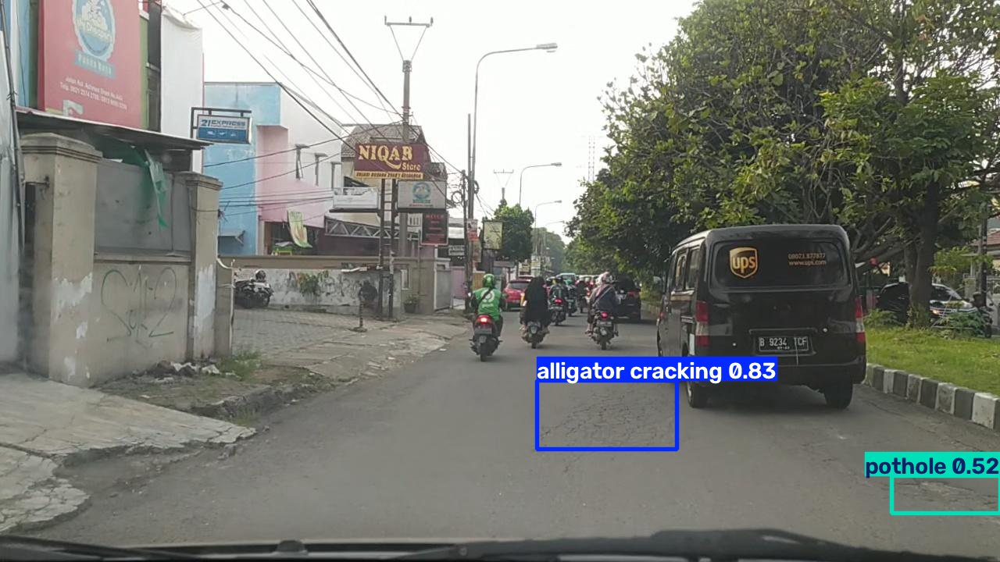


image 1/1 /workspaces/road-damage-detection/notebooks/../data/raw/road-damage-1/test/images/AD_14650_jpeg.rf.4e908a8fb769a12760cddf31eefcda3f.jpg: 384x640 (no detections), 58.1ms
Speed: 4.8ms preprocess, 58.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


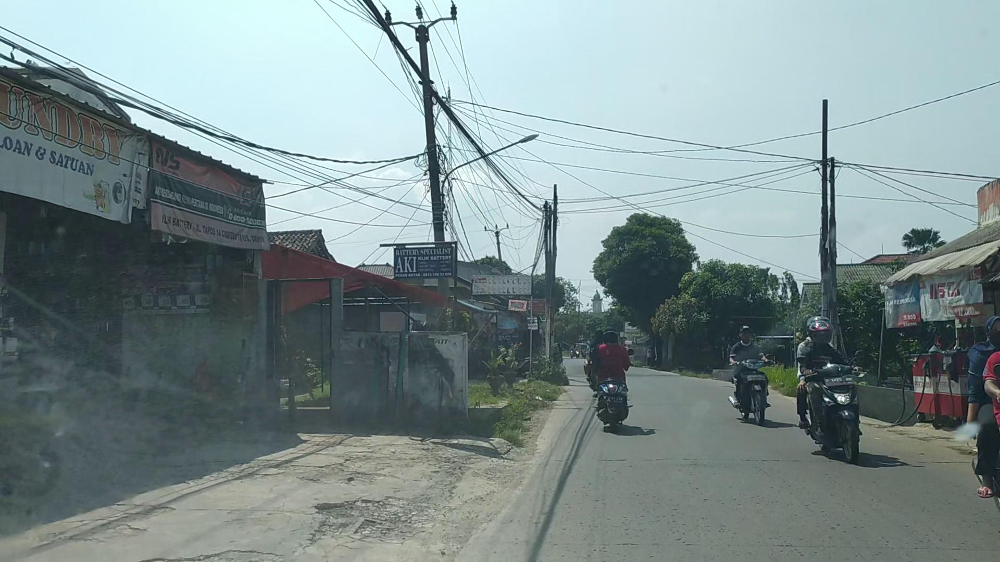

In [7]:
# Load our trained model and run it on a few unseen test images
# to visually check how well it detects road damage
# نحمّل الموديل المدرّب ونجربه على كم صورة من مجموعة الاختبار
# (صور ما شافها الموديل أبداً أثناء التدريب) لنشوف بصرياً كيف أداءه
from ultralytics import YOLO
import random
import os

model = YOLO("../models/best.pt")

test_images_dir = "../data/raw/road-damage-1/test/images"
test_images = os.listdir(test_images_dir)

sample_images = random.sample(test_images, 5)

for img_name in sample_images:
    img_path = os.path.join(test_images_dir, img_name)
    results = model.predict(img_path, conf=0.25)

    results[0].show()